In [1]:
# Installing and importing all the required packages

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import pearsonr, spearmanr
import numpy as np
from pprint import pprint
import missingno as msno
import random

from sklearn.ensemble import IsolationForest
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import scale, StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [2]:
# Loading 'final_data.csv' file which has both Artists data and Genres data

data = pd.read_csv("final_data.csv")

In [3]:
# Displaying first five instances of the 'final_data.csv' file

data.head()

,song_id,tempo,zero_crossings,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_contrast_mean,spectral_contrast_var,spectral_centroids_mean,spectral_centroids_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_flatness_mean,spectral_flatness_var,chroma_stft1_mean,chroma_stft2_mean,chroma_stft3_mean,chroma_stft4_mean,chroma_stft5_mean,chroma_stft6_mean,chroma_stft7_mean,chroma_stft8_mean,chroma_stft9_mean,chroma_stft10_mean,chroma_stft11_mean,chroma_stft12_mean,chroma_stft1_var,chroma_stft2_var,chroma_stft3_var,chroma_stft4_var,chroma_stft5_var,chroma_stft6_var,chroma_stft7_var,chroma_stft8_var,chroma_stft9_var,chroma_stft10_var,chroma_stft11_var,chroma_stft12_var,chroma_cqt1_mean,chroma_cqt2_mean,chroma_cqt3_mean,chroma_cqt4_mean,chroma_cqt5_mean,chroma_cqt6_mean,chroma_cqt7_mean,chroma_cqt8_mean,chroma_cqt9_mean,chroma_cqt10_mean,chroma_cqt11_mean,chroma_cqt12_mean,chroma_cqt1_var,chroma_cqt2_var,chroma_cqt3_var,chroma_cqt4_var,chroma_cqt5_var,chroma_cqt6_var,chroma_cqt7_var,chroma_cqt8_var,chroma_cqt9_var,chroma_cqt10_var,chroma_cqt11_var,chroma_cqt12_var,chroma_cens1_mean,chroma_cens2_mean,chroma_cens3_mean,chroma_cens4_mean,chroma_cens5_mean,chroma_cens6_mean,chroma_cens7_mean,chroma_cens8_mean,chroma_cens9_mean,chroma_cens10_mean,chroma_cens11_mean,chroma_cens12_mean,chroma_cens1_var,chroma_cens2_var,chroma_cens3_var,chroma_cens4_var,chroma_cens5_var,chroma_cens6_var,chroma_cens7_var,chroma_cens8_var,chroma_cens9_var,chroma_cens10_var,chroma_cens11_var,chroma_cens12_var,mfcc1_mean,mfcc2_mean,mfcc3_mean,mfcc4_mean,mfcc5_mean,mfcc6_mean,mfcc7_mean,mfcc8_mean,mfcc9_mean,mfcc10_mean,mfcc11_mean,mfcc12_mean,mfcc13_mean,mfcc14_mean,mfcc15_mean,mfcc16_mean,mfcc17_mean,mfcc18_mean,mfcc19_mean,mfcc20_mean,mfcc1_var,mfcc2_var,mfcc3_var,mfcc4_var,mfcc5_var,mfcc6_var,mfcc7_var,mfcc8_var,mfcc9_var,mfcc10_var,mfcc11_var,mfcc12_var,mfcc13_var,mfcc14_var,mfcc15_var,mfcc16_var,mfcc17_var,mfcc18_var,mfcc19_var,mfcc20_var,language,target
0,Adam Levine_2XC5KXWV_0,161.499023,18664,0.250031,0.106033,0.709966,0.126503,0.226523,0.093115,0.294194,0.145222,0.601582,0.235287,0.106727,0.055632,0.056829,0.041799,0.054273,0.076117,0.110951,0.101199,0.113925,0.156302,0.082302,0.105130,0.069012,0.023687,0.032547,0.024574,0.033265,0.053648,0.076736,0.057770,0.054091,0.108590,0.038318,0.057959,0.361720,0.257678,0.222194,0.192583,0.182521,0.199737,0.251778,0.196310,0.153371,0.246327,0.276046,0.356825,0.142894,0.140059,0.115312,0.077633,0.063007,0.068473,0.109528,0.074432,0.046372,0.098810,0.102421,0.148301,0.283087,0.165816,0.135537,0.126255,0.131761,0.144933,0.206582,0.149107,0.092281,0.213162,0.219543,0.268804,0.043240,0.037625,0.028768,0.020402,0.011827,0.024802,0.065735,0.017560,0.009331,0.036217,0.029219,0.061203,-664.094238,-20.178219,13.030993,-8.986321,-5.882592,-1.390400,0.012740,-1.351957,-4.549717,15.675048,-5.379923,7.401585,-1.294725,-12.653774,4.765732,-3.470662,0.109158,2.529179,-0.332772,3.772192,1554.288818,1656.155273,473.269958,328.728271,256.569397,117.519424,180.297348,139.818085,270.766541,577.722839,375.841614,124.179192,76.519447,372.545959,104.322502,75.400368,63.861107,60.659458,117.492096,87.015053,English,English_Adam Levine
1,Adam Levine_2XC5KXWV_1,151.999081,26676,0.601275,0.026921,0.421439,0.039646,0.355163,0.042216,0.539744,0.034543,0.084628,0.031628,0.142215,0.117891,0.168312,0.269239,0.280652,0.228933,0.245811,0.287904,0.354243,0.316412,0.241638,0.267294,0.040928,0.038206,0.065295,0.109969,0.108950,0.083830,0.091351,0.127271,0.150161,0.127901,0.091929,0.130513,0.317888,0.227249,0.265937,0.341636,0.445205,0.313164,0.309996,0.360882,0.285678,0.302664,0.338164,0.478159,0.082719,0.064407,0.085742,0.095554,0.139757,0.075790,0.078204,0.105206,0.068290,0.101289,0.085863,0.150393,0.229765,0.129117,0.160025,0.245432,0.338773,0.234122,0.212981,0.264697,0.197457,0.185654,0.258904,0.350824,0.017765,0.014962,0.014354,0.020998,0.049552,0.022464,0.011566,0.037067,0.009537,0.016215,0.022743,0.058898,-324.464386,18.919701,-21.99

In [4]:
# Displaying the total count of instances and attributes present in the 'final_data.csv' file

data.shape

(22775, 127)

In [5]:
# Displaying the data type for each and every attribute in the 'final_data.csv' file

data.dtypes

song_id                     object
tempo                      float64
zero_crossings               int64
spectral_bandwidth_mean    float64
spectral_bandwidth_var     float64
spectral_contrast_mean     float64
spectral_contrast_var      float64
spectral_centroids_mean    float64
spectral_centroids_var     float64
spectral_rolloff_mean      float64
spectral_rolloff_var       float64
spectral_flatness_mean     float64
spectral_flatness_var      float64
chroma_stft1_mean          float64
chroma_stft2_mean          float64
chroma_stft3_mean          float64
chroma_stft4_mean          float64
chroma_stft5_mean          float64
chroma_stft6_mean          float64
chroma_stft7_mean          float64
chroma_stft8_mean          float64
chroma_stft9_mean          float64
chroma_stft10_mean         float64
chroma_stft11_mean         float64
chroma_stft12_mean         float64
chroma_stft1_var           float64
chroma_stft2_var           float64
chroma_stft3_var           float64
chroma_stft4_var    

In [6]:
# Applying .info() function to get the range and memory usage details

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22775 entries, 0 to 22774
Columns: 127 entries, song_id to target
dtypes: float64(123), int64(1), object(3)
memory usage: 22.1+ MB


In [7]:
# Displaying statistical description of the data with 5 point summary

data.describe()

,tempo,zero_crossings,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_contrast_mean,spectral_contrast_var,spectral_centroids_mean,spectral_centroids_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_flatness_mean,spectral_flatness_var,chroma_stft1_mean,chroma_stft2_mean,chroma_stft3_mean,chroma_stft4_mean,chroma_stft5_mean,chroma_stft6_mean,chroma_stft7_mean,chroma_stft8_mean,chroma_stft9_mean,chroma_stft10_mean,chroma_stft11_mean,chroma_stft12_mean,chroma_stft1_var,chroma_stft2_var,chroma_stft3_var,chroma_stft4_var,chroma_stft5_var,chroma_stft6_var,chroma_stft7_var,chroma_stft8_var,chroma_stft9_var,chroma_stft10_var,chroma_stft11_var,chroma_stft12_var,chroma_cqt1_mean,chroma_cqt2_mean,chroma_cqt3_mean,chroma_cqt4_mean,chroma_cqt5_mean,chroma_cqt6_mean,chroma_cqt7_mean,chroma_cqt8_mean,chroma_cqt9_mean,chroma_cqt10_mean,chroma_cqt11_mean,chroma_cqt12_mean,chroma_cqt1_var,chroma_cqt2_var,chroma_cqt3_var,chroma_cqt4_var,chroma_cqt5_var,chroma_cqt6_var,chroma_cqt7_var,chroma_cqt8_var,chroma_cqt9_var,chroma_cqt10_var,chroma_cqt11_var,chroma_cqt12_var,chroma_cens1_mean,chroma_cens2_mean,chroma_cens3_mean,chroma_cens4_mean,chroma_cens5_mean,chroma_cens6_mean,chroma_cens7_mean,chroma_cens8_mean,chroma_cens9_mean,chroma_cens10_mean,chroma_cens11_mean,chroma_cens12_mean,chroma_cens1_var,chroma_cens2_var,chroma_cens3_var,chroma_cens4_var,chroma_cens5_var,chroma_cens6_var,chroma_cens7_var,chroma_cens8_var,chroma_cens9_var,chroma_cens10_var,chroma_cens11_var,chroma_cens12_var,mfcc1_mean,mfcc2_mean,mfcc3_mean,mfcc4_mean,mfcc5_mean,mfcc6_mean,mfcc7_mean,mfcc8_mean,mfcc9_mean,mfcc10_mean,mfcc11_mean,mfcc12_mean,mfcc13_mean,mfcc14_mean,mfcc15_mean,mfcc16_mean,mfcc17_mean,mfcc18_mean,mfcc19_mean,mfcc20_mean,mfcc1_var,mfcc2_var,mfcc3_var,mfcc4_var,mfcc5_var,mfcc6_var,mfcc7_var,mfcc8_var,mfcc9_var,mfcc10_var,mfcc11_var,mfcc12_var,mfcc13_var,mfcc14_var,mfcc15_var,mfcc16_var,mfcc17_var,mfcc18_var,mfcc19_var,mfcc20_var
count,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000,22775.000000
mean,125.931929,13895.126454,0.659302,0.024080,0.489446,0.022954,0.469626,0.028363,0.560467,0.043551,0.132647,0.033433,0.297242,0.288567,0.301358,0.294983,0.306245,0.286495,0.291406,0.301577,0.295213,0.314481,0.294832,0.301883,0.078912,0.074785,0.081646,0.075845,0.080881,0.073367,0.075079,0.079415,0.073569,0.084002,0.074502,0.079207,0.376058,0.367729,0.379625,0.369456,0.393438,0.377285,0.386563,0.402594,0.386067,0.399177,0.369630,0.3

In [8]:
# Displaying the total number of instances count split on the basis of language variable

data['language'].value_counts()

English    10804
Hindi       6227
Telugu      5744
Name: language, dtype: int64

In [9]:
# Displaying the total number of instances count split on the basis of target variable

data['target'].value_counts().sort_index()

English_Adam Levine      1229
English_Drake            1580
English_HipHopParty      1017
English_Justin Bieber    1599
English_Rock             1188
English_Romantic          895
English_Selena Gomez     1471
English_The Weeknd        983
English_Workout           842
Hindi_arijit             1168
Hindi_atifaslam          1060
Hindi_rock                810
Hindi_romantic            842
Hindi_sonunigam          1326
Hindi_workout            1021
Telugu_anurag             468
Telugu_armaan             705
Telugu_geetha            1162
Telugu_rock               648
Telugu_romantic          1263
Telugu_sidsriram          365
Telugu_workout           1133
Name: target, dtype: int64

# Splitting of data into Artists and Genres datasets

In [17]:
# Code to split data into Artists and Genres datasets

artist_list = ['English_Adam Levine', 'English_Drake', 'English_Justin Bieber', 'English_Selena Gomez', 'English_The Weeknd',
               'Hindi_arijit', 'Hindi_atifaslam', 'Hindi_sonunigam',
               'Telugu_anurag', 'Telugu_armaan', 'Telugu_geetha', 'Telugu_sidsriram']

genre_list = ['English_HipHopParty', 'English_Rock', 'English_Romantic', 'English_Workout',
              'Hindi_rock', 'Hindi_romantic', 'Hindi_workout',
              'Telugu_rock', 'Telugu_romantic', 'Telugu_workout']

# data[data.target.isin(genre_list)]['target'].value_counts()

artist_data = data[data.target.isin(artist_list)]
genre_data  = data[data.target.isin(genre_list)]

artist_data.to_csv('Artist_Data.csv')
genre_data.to_csv('Genre_Data.csv')

# Genre Data

In [18]:
# Displaying first five instances of the genres data

genre_data.reset_index(inplace = True)
genre_data.head()

,index,song_id,tempo,zero_crossings,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_contrast_mean,spectral_contrast_var,spectral_centroids_mean,spectral_centroids_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_flatness_mean,spectral_flatness_var,chroma_stft1_mean,chroma_stft2_mean,chroma_stft3_mean,chroma_stft4_mean,chroma_stft5_mean,chroma_stft6_mean,chroma_stft7_mean,chroma_stft8_mean,chroma_stft9_mean,chroma_stft10_mean,chroma_stft11_mean,chroma_stft12_mean,chroma_stft1_var,chroma_stft2_var,chroma_stft3_var,chroma_stft4_var,chroma_stft5_var,chroma_stft6_var,chroma_stft7_var,chroma_stft8_var,chroma_stft9_var,chroma_stft10_var,chroma_stft11_var,chroma_stft12_var,chroma_cqt1_mean,chroma_cqt2_mean,chroma_cqt3_mean,chroma_cqt4_mean,chroma_cqt5_mean,chroma_cqt6_mean,chroma_cqt7_mean,chroma_cqt8_mean,chroma_cqt9_mean,chroma_cqt10_mean,chroma_cqt11_mean,chroma_cqt12_mean,chroma_cqt1_var,chroma_cqt2_var,chroma_cqt3_var,chroma_cqt4_var,chroma_cqt5_var,chroma_cqt6_var,chroma_cqt7_var,chroma_cqt8_var,chroma_cqt9_var,chroma_cqt10_var,chroma_cqt11_var,chroma_cqt12_var,chroma_cens1_mean,chroma_cens2_mean,chroma_cens3_mean,chroma_cens4_mean,chroma_cens5_mean,chroma_cens6_mean,chroma_cens7_mean,chroma_cens8_mean,chroma_cens9_mean,chroma_cens10_mean,chroma_cens11_mean,chroma_cens12_mean,chroma_cens1_var,chroma_cens2_var,chroma_cens3_var,chroma_cens4_var,chroma_cens5_var,chroma_cens6_var,chroma_cens7_var,chroma_cens8_var,chroma_cens9_var,chroma_cens10_var,chroma_cens11_var,chroma_cens12_var,mfcc1_mean,mfcc2_mean,mfcc3_mean,mfcc4_mean,mfcc5_mean,mfcc6_mean,mfcc7_mean,mfcc8_mean,mfcc9_mean,mfcc10_mean,mfcc11_mean,mfcc12_mean,mfcc13_mean,mfcc14_mean,mfcc15_mean,mfcc16_mean,mfcc17_mean,mfcc18_mean,mfcc19_mean,mfcc20_mean,mfcc1_var,mfcc2_var,mfcc3_var,mfcc4_var,mfcc5_var,mfcc6_var,mfcc7_var,mfcc8_var,mfcc9_var,mfcc10_var,mfcc11_var,mfcc12_var,mfcc13_var,mfcc14_var,mfcc15_var,mfcc16_var,mfcc17_var,mfcc18_var,mfcc19_var,mfcc20_var,language,target
0,13116,HipHopParty_0Lk6ud3Z_0,143.554688,6673,0.406316,0.063032,0.511250,0.023020,0.233407,0.040417,0.260502,0.056887,0.091450,0.069764,0.659193,0.338531,0.281088,0.266390,0.320312,0.326186,0.279484,0.505889,0.279022,0.267401,0.281555,0.387670,0.148722,0.067775,0.050686,0.053527,0.065319,0.124833,0.037745,0.151701,0.045272,0.055721,0.057638,0.071871,0.659421,0.315029,0.208500,0.213486,0.249483,0.354785,0.254501,0.428098,0.249461,0.230594,0.231738,0.341168,0.126362,0.032112,0.014765,0.034374,0.026940,0.135208,0.035201,0.099956,0.067107,0.042562,0.045044,0.067460,0.493671,0.239751,0.135842,0.109418,0.171730,0.224552,0.179158,0.324900,0.127329,0.128942,0.140057,0.276892,0.064896,0.028639,0.004756,0.011058,0.013394,0.067345,0.024489,0.021079,0.027269,0.019554,0.013077,0.026130,-311.608398,152.354553,-19.173849,12.700377,4.848783,0.461114,-0.700180,-0.815076,-2.238945,0.485539,-2.410562,0.683446,-0.124016,-1.119311,-1.483537,0.307594,-1.174238,-2.476235,-5.076760,-3.074460,28360.132812,6455.971191,1439.994263,214.888306,337.984772,109.810638,161.277832,117.159019,68.595200,31.245186,67.459167,28.445253,43.940331,33.477280,42.131500,43.554569,34.134747,16.681623,26.304237,14.261354,English,English_HipHopParty
1,13117,HipHopParty_0Lk6ud3Z_1,143.554688,7026,0.465727,0.060442,0.646593,0.018906,0.294157,0.041272,0.348852,0.076992,0.051287,0.018157,0.667694,0.336765,0.304403,0.290750,0.370281,0.343973,0.298520,0.541088,0.276383,0.260429,0.291573,0.389732,0.132152,0.056209,0.055813,0.051812,0.070701,0.119527,0.039436,0.142491,0.033267,0.043559,0.058849,0.063822,0.697372,0.322381,0.220581,0.237045,0.267559,0.363001,0.255500,0.436059,0.233895,0.222208,0.232414,0.300895,0.123828,0.037157,0.025375,0.053321,0.026575,0.133487,0.034220,0.091250,0.054612,0.039248,0.046811,0.042228,0.515886,0.246270,0.135610,0.124979,0.199342,0.235060,0.178619,0.340746,0.121191,0.119355,0.142796,0.253970,0.057380,0.025289,0.004792,0.010755,0.014072,0.064368,0.022562,0.018509,0.017712,0.015365,0.015281,0.016290,-247.848007,157.

In [19]:
# Displaying first five instances of the genres data

genre_data = genre_data.drop('index', axis = 1)
genre_data.head()

,song_id,tempo,zero_crossings,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_contrast_mean,spectral_contrast_var,spectral_centroids_mean,spectral_centroids_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_flatness_mean,spectral_flatness_var,chroma_stft1_mean,chroma_stft2_mean,chroma_stft3_mean,chroma_stft4_mean,chroma_stft5_mean,chroma_stft6_mean,chroma_stft7_mean,chroma_stft8_mean,chroma_stft9_mean,chroma_stft10_mean,chroma_stft11_mean,chroma_stft12_mean,chroma_stft1_var,chroma_stft2_var,chroma_stft3_var,chroma_stft4_var,chroma_stft5_var,chroma_stft6_var,chroma_stft7_var,chroma_stft8_var,chroma_stft9_var,chroma_stft10_var,chroma_stft11_var,chroma_stft12_var,chroma_cqt1_mean,chroma_cqt2_mean,chroma_cqt3_mean,chroma_cqt4_mean,chroma_cqt5_mean,chroma_cqt6_mean,chroma_cqt7_mean,chroma_cqt8_mean,chroma_cqt9_mean,chroma_cqt10_mean,chroma_cqt11_mean,chroma_cqt12_mean,chroma_cqt1_var,chroma_cqt2_var,chroma_cqt3_var,chroma_cqt4_var,chroma_cqt5_var,chroma_cqt6_var,chroma_cqt7_var,chroma_cqt8_var,chroma_cqt9_var,chroma_cqt10_var,chroma_cqt11_var,chroma_cqt12_var,chroma_cens1_mean,chroma_cens2_mean,chroma_cens3_mean,chroma_cens4_mean,chroma_cens5_mean,chroma_cens6_mean,chroma_cens7_mean,chroma_cens8_mean,chroma_cens9_mean,chroma_cens10_mean,chroma_cens11_mean,chroma_cens12_mean,chroma_cens1_var,chroma_cens2_var,chroma_cens3_var,chroma_cens4_var,chroma_cens5_var,chroma_cens6_var,chroma_cens7_var,chroma_cens8_var,chroma_cens9_var,chroma_cens10_var,chroma_cens11_var,chroma_cens12_var,mfcc1_mean,mfcc2_mean,mfcc3_mean,mfcc4_mean,mfcc5_mean,mfcc6_mean,mfcc7_mean,mfcc8_mean,mfcc9_mean,mfcc10_mean,mfcc11_mean,mfcc12_mean,mfcc13_mean,mfcc14_mean,mfcc15_mean,mfcc16_mean,mfcc17_mean,mfcc18_mean,mfcc19_mean,mfcc20_mean,mfcc1_var,mfcc2_var,mfcc3_var,mfcc4_var,mfcc5_var,mfcc6_var,mfcc7_var,mfcc8_var,mfcc9_var,mfcc10_var,mfcc11_var,mfcc12_var,mfcc13_var,mfcc14_var,mfcc15_var,mfcc16_var,mfcc17_var,mfcc18_var,mfcc19_var,mfcc20_var,language,target
0,HipHopParty_0Lk6ud3Z_0,143.554688,6673,0.406316,0.063032,0.511250,0.023020,0.233407,0.040417,0.260502,0.056887,0.091450,0.069764,0.659193,0.338531,0.281088,0.266390,0.320312,0.326186,0.279484,0.505889,0.279022,0.267401,0.281555,0.387670,0.148722,0.067775,0.050686,0.053527,0.065319,0.124833,0.037745,0.151701,0.045272,0.055721,0.057638,0.071871,0.659421,0.315029,0.208500,0.213486,0.249483,0.354785,0.254501,0.428098,0.249461,0.230594,0.231738,0.341168,0.126362,0.032112,0.014765,0.034374,0.026940,0.135208,0.035201,0.099956,0.067107,0.042562,0.045044,0.067460,0.493671,0.239751,0.135842,0.109418,0.171730,0.224552,0.179158,0.324900,0.127329,0.128942,0.140057,0.276892,0.064896,0.028639,0.004756,0.011058,0.013394,0.067345,0.024489,0.021079,0.027269,0.019554,0.013077,0.026130,-311.608398,152.354553,-19.173849,12.700377,4.848783,0.461114,-0.700180,-0.815076,-2.238945,0.485539,-2.410562,0.683446,-0.124016,-1.119311,-1.483537,0.307594,-1.174238,-2.476235,-5.076760,-3.074460,28360.132812,6455.971191,1439.994263,214.888306,337.984772,109.810638,161.277832,117.159019,68.595200,31.245186,67.459167,28.445253,43.940331,33.477280,42.131500,43.554569,34.134747,16.681623,26.304237,14.261354,English,English_HipHopParty
1,HipHopParty_0Lk6ud3Z_1,143.554688,7026,0.465727,0.060442,0.646593,0.018906,0.294157,0.041272,0.348852,0.076992,0.051287,0.018157,0.667694,0.336765,0.304403,0.290750,0.370281,0.343973,0.298520,0.541088,0.276383,0.260429,0.291573,0.389732,0.132152,0.056209,0.055813,0.051812,0.070701,0.119527,0.039436,0.142491,0.033267,0.043559,0.058849,0.063822,0.697372,0.322381,0.220581,0.237045,0.267559,0.363001,0.255500,0.436059,0.233895,0.222208,0.232414,0.300895,0.123828,0.037157,0.025375,0.053321,0.026575,0.133487,0.034220,0.091250,0.054612,0.039248,0.046811,0.042228,0.515886,0.246270,0.135610,0.124979,0.199342,0.235060,0.178619,0.340746,0.121191,0.119355,0.142796,0.253970,0.057380,0.025289,0.004792,0.010755,0.014072,0.064368,0.022562,0.018509,0.017712,0.015365,0.015281,0.016290,-247.848007,157.431854,-16.442629,

In [20]:
# Displaying the total count of instances and attributes present in the genres data

genre_data.shape

(9659, 127)

In [21]:
# Displaying the data type for each and every attribute in the genres data

genre_data.dtypes

song_id                     object
tempo                      float64
zero_crossings               int64
spectral_bandwidth_mean    float64
spectral_bandwidth_var     float64
spectral_contrast_mean     float64
spectral_contrast_var      float64
spectral_centroids_mean    float64
spectral_centroids_var     float64
spectral_rolloff_mean      float64
spectral_rolloff_var       float64
spectral_flatness_mean     float64
spectral_flatness_var      float64
chroma_stft1_mean          float64
chroma_stft2_mean          float64
chroma_stft3_mean          float64
chroma_stft4_mean          float64
chroma_stft5_mean          float64
chroma_stft6_mean          float64
chroma_stft7_mean          float64
chroma_stft8_mean          float64
chroma_stft9_mean          float64
chroma_stft10_mean         float64
chroma_stft11_mean         float64
chroma_stft12_mean         float64
chroma_stft1_var           float64
chroma_stft2_var           float64
chroma_stft3_var           float64
chroma_stft4_var    

In [22]:
# Applying .info() function to get the range and memory usage details

genre_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9659 entries, 0 to 9658
Columns: 127 entries, song_id to target
dtypes: float64(123), int64(1), object(3)
memory usage: 9.4+ MB


In [23]:
# Displaying statistical description of the data with 5 point summary

genre_data.describe()

,tempo,zero_crossings,spectral_bandwidth_mean,spectral_bandwidth_var,spectral_contrast_mean,spectral_contrast_var,spectral_centroids_mean,spectral_centroids_var,spectral_rolloff_mean,spectral_rolloff_var,spectral_flatness_mean,spectral_flatness_var,chroma_stft1_mean,chroma_stft2_mean,chroma_stft3_mean,chroma_stft4_mean,chroma_stft5_mean,chroma_stft6_mean,chroma_stft7_mean,chroma_stft8_mean,chroma_stft9_mean,chroma_stft10_mean,chroma_stft11_mean,chroma_stft12_mean,chroma_stft1_var,chroma_stft2_var,chroma_stft3_var,chroma_stft4_var,chroma_stft5_var,chroma_stft6_var,chroma_stft7_var,chroma_stft8_var,chroma_stft9_var,chroma_stft10_var,chroma_stft11_var,chroma_stft12_var,chroma_cqt1_mean,chroma_cqt2_mean,chroma_cqt3_mean,chroma_cqt4_mean,chroma_cqt5_mean,chroma_cqt6_mean,chroma_cqt7_mean,chroma_cqt8_mean,chroma_cqt9_mean,chroma_cqt10_mean,chroma_cqt11_mean,chroma_cqt12_mean,chroma_cqt1_var,chroma_cqt2_var,chroma_cqt3_var,chroma_cqt4_var,chroma_cqt5_var,chroma_cqt6_var,chroma_cqt7_var,chroma_cqt8_var,chroma_cqt9_var,chroma_cqt10_var,chroma_cqt11_var,chroma_cqt12_var,chroma_cens1_mean,chroma_cens2_mean,chroma_cens3_mean,chroma_cens4_mean,chroma_cens5_mean,chroma_cens6_mean,chroma_cens7_mean,chroma_cens8_mean,chroma_cens9_mean,chroma_cens10_mean,chroma_cens11_mean,chroma_cens12_mean,chroma_cens1_var,chroma_cens2_var,chroma_cens3_var,chroma_cens4_var,chroma_cens5_var,chroma_cens6_var,chroma_cens7_var,chroma_cens8_var,chroma_cens9_var,chroma_cens10_var,chroma_cens11_var,chroma_cens12_var,mfcc1_mean,mfcc2_mean,mfcc3_mean,mfcc4_mean,mfcc5_mean,mfcc6_mean,mfcc7_mean,mfcc8_mean,mfcc9_mean,mfcc10_mean,mfcc11_mean,mfcc12_mean,mfcc13_mean,mfcc14_mean,mfcc15_mean,mfcc16_mean,mfcc17_mean,mfcc18_mean,mfcc19_mean,mfcc20_mean,mfcc1_var,mfcc2_var,mfcc3_var,mfcc4_var,mfcc5_var,mfcc6_var,mfcc7_var,mfcc8_var,mfcc9_var,mfcc10_var,mfcc11_var,mfcc12_var,mfcc13_var,mfcc14_var,mfcc15_var,mfcc16_var,mfcc17_var,mfcc18_var,mfcc19_var,mfcc20_var
count,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000,9659.000000
mean,124.062342,10169.248887,0.712085,0.014659,0.515811,0.015851,0.518039,0.022388,0.576732,0.032726,0.152419,0.030645,0.372305,0.355536,0.371838,0.360722,0.386826,0.359692,0.369563,0.384515,0.377410,0.401870,0.370482,0.381707,0.074288,0.067134,0.075384,0.067615,0.077266,0.068952,0.071017,0.075646,0.070158,0.081021,0.068385,0.074281,0.439659,0.428833,0.452321,0.431260,0.481167,0.449754,0.470494,0.499953,0.464094,0.483803,0.418850,0.426482,0.045756,0.042252,0.047430,0.041578,0.047728,0.043772,0.045401,0.050174,0.045339,0.050197,0.042969,0.046336,0.233354,0

In [24]:
# Displaying the total number of instances count split on the basis of language variable for genres data

genre_data['language'].value_counts()

English    3942
Telugu     3044
Hindi      2673
Name: language, dtype: int64

In [25]:
# Displaying the total number of instances count split on the basis of target variable for genres data

genre_data['target'].value_counts().sort_index()

English_HipHopParty    1017
English_Rock           1188
English_Romantic        895
English_Workout         842
Hindi_rock              810
Hindi_romantic          842
Hindi_workout          1021
Telugu_rock             648
Telugu_romantic        1263
Telugu_workout         1133
Name: target, dtype: int64

In [26]:
# To display the unique values present in each feature of the genres data

genre_data.nunique()

song_id                    9636
tempo                        27
zero_crossings             6744
spectral_bandwidth_mean    9523
spectral_bandwidth_var     9523
spectral_contrast_mean     9523
spectral_contrast_var      9523
spectral_centroids_mean    9523
spectral_centroids_var     9523
spectral_rolloff_mean      9520
spectral_rolloff_var       9523
spectral_flatness_mean     9519
spectral_flatness_var      9517
chroma_stft1_mean          9517
chroma_stft2_mean          9520
chroma_stft3_mean          9520
chroma_stft4_mean          9520
chroma_stft5_mean          9520
chroma_stft6_mean          9520
chroma_stft7_mean          9519
chroma_stft8_mean          9517
chroma_stft9_mean          9519
chroma_stft10_mean         9519
chroma_stft11_mean         9520
chroma_stft12_mean         9518
chroma_stft1_var           9521
chroma_stft2_var           9520
chroma_stft3_var           9519
chroma_stft4_var           9520
chroma_stft5_var           9518
chroma_stft6_var           9523
chroma_s

In [27]:
# To display the total number of null values present against each attribute in the genres data

genre_data.apply(lambda x: sum(x.isnull()),axis=0)

song_id                    0
tempo                      0
zero_crossings             0
spectral_bandwidth_mean    0
spectral_bandwidth_var     0
spectral_contrast_mean     0
spectral_contrast_var      0
spectral_centroids_mean    0
spectral_centroids_var     0
spectral_rolloff_mean      0
spectral_rolloff_var       0
spectral_flatness_mean     0
spectral_flatness_var      0
chroma_stft1_mean          0
chroma_stft2_mean          0
chroma_stft3_mean          0
chroma_stft4_mean          0
chroma_stft5_mean          0
chroma_stft6_mean          0
chroma_stft7_mean          0
chroma_stft8_mean          0
chroma_stft9_mean          0
chroma_stft10_mean         0
chroma_stft11_mean         0
chroma_stft12_mean         0
chroma_stft1_var           0
chroma_stft2_var           0
chroma_stft3_var           0
chroma_stft4_var           0
chroma_stft5_var           0
chroma_stft6_var           0
chroma_stft7_var           0
chroma_stft8_var           0
chroma_stft9_var           0
chroma_stft10_

<Figure size 1080x576 with 0 Axes>

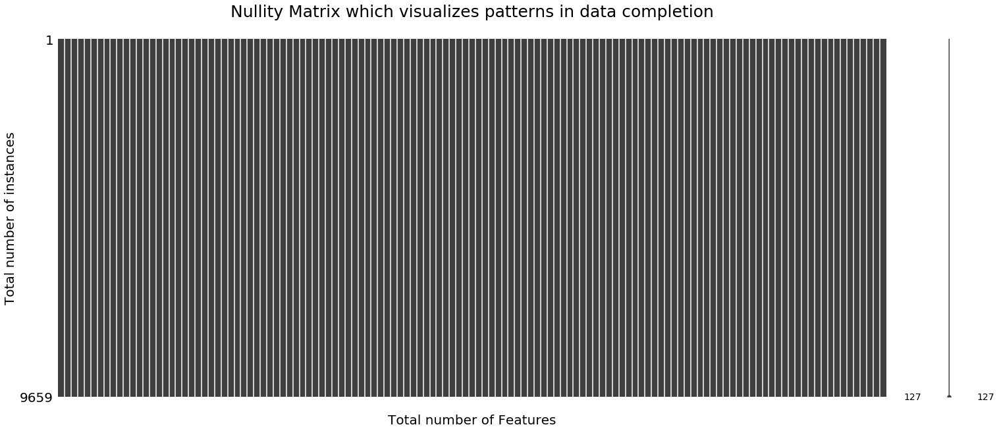

In [29]:
# Plotting the presence of null values using the missingno package

plt.figure(figsize=(15,8))
msno.matrix(genre_data)
plt.title("Nullity Matrix which visualizes patterns in data completion\n",size = 25)
plt.xlabel("\nTotal number of Features",size = 20)
plt.ylabel("Total number of instances",size = 20)
plt.show()

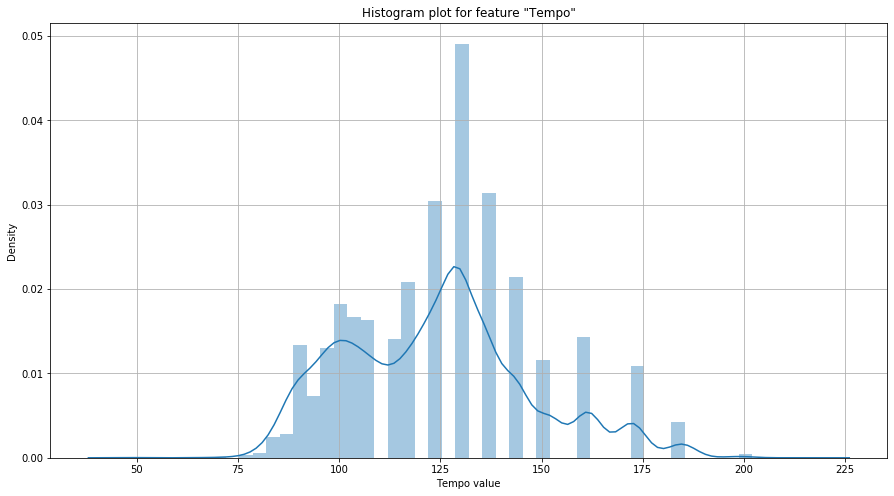

In [30]:
# Graphical univariate analysis on different features of the data

plt.figure(figsize=(15,8))
sns.distplot(genre_data['tempo'])
plt.grid()
plt.xlabel('Tempo value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Tempo"')
plt.show()

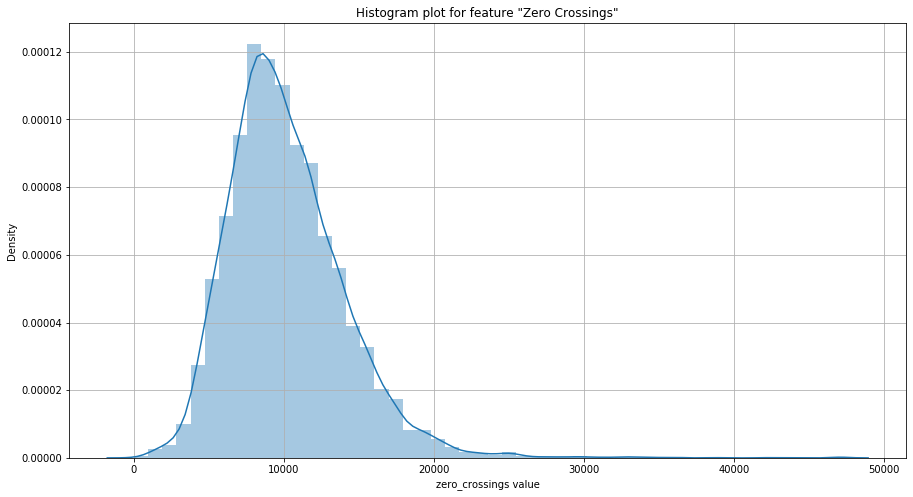

In [31]:
plt.figure(figsize=(15,8))
sns.distplot(genre_data['zero_crossings'])
plt.grid()
plt.xlabel('zero_crossings value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Zero Crossings"')
plt.show()

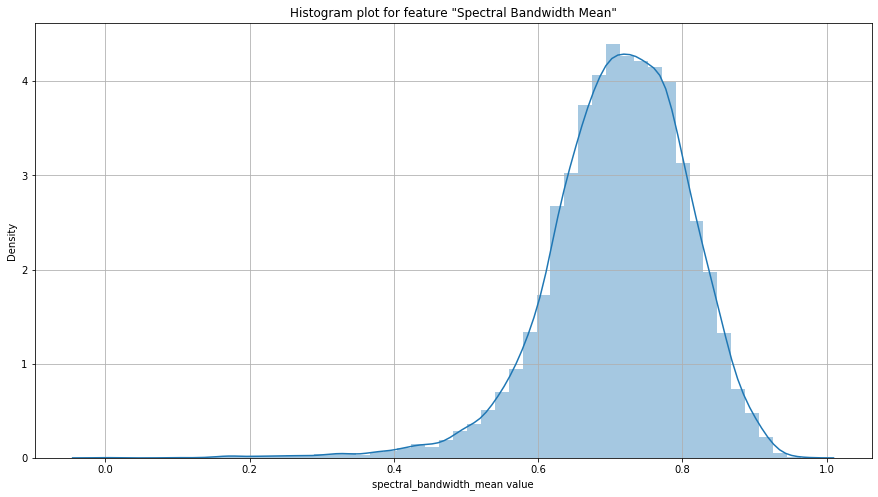

In [32]:
plt.figure(figsize=(15,8))
sns.distplot(genre_data['spectral_bandwidth_mean'])
plt.grid()
plt.xlabel('spectral_bandwidth_mean value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Spectral Bandwidth Mean"')
plt.show()

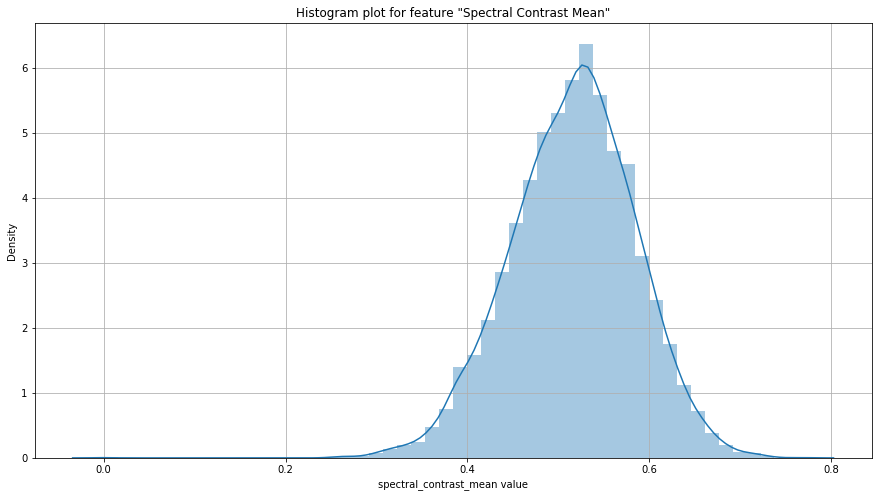

In [33]:
plt.figure(figsize=(15,8))
sns.distplot(genre_data['spectral_contrast_mean'])
plt.grid()
plt.xlabel('spectral_contrast_mean value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Spectral Contrast Mean"')
plt.show()

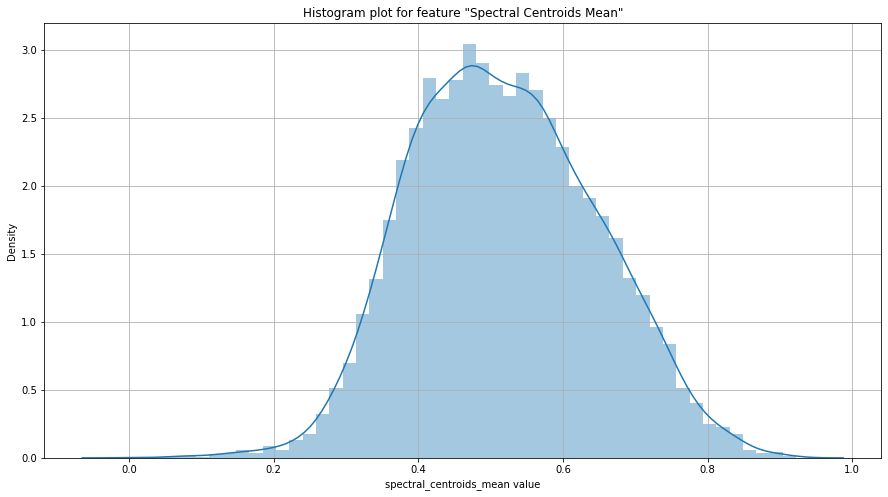

In [34]:
plt.figure(figsize=(15,8))
sns.distplot(genre_data['spectral_centroids_mean'])
plt.grid()
plt.xlabel('spectral_centroids_mean value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Spectral Centroids Mean"')
plt.show()

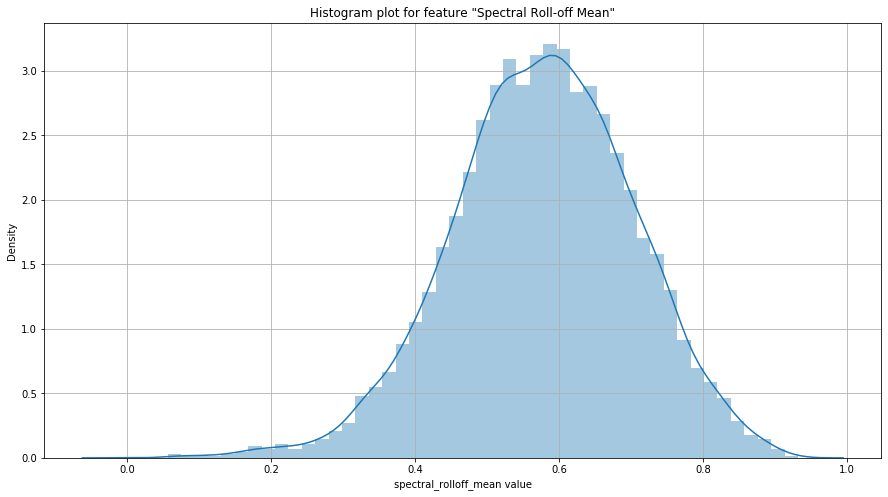

In [35]:
plt.figure(figsize=(15,8))
sns.distplot(genre_data['spectral_rolloff_mean'])
plt.grid()
plt.xlabel('spectral_rolloff_mean value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Spectral Roll-off Mean"')
plt.show()

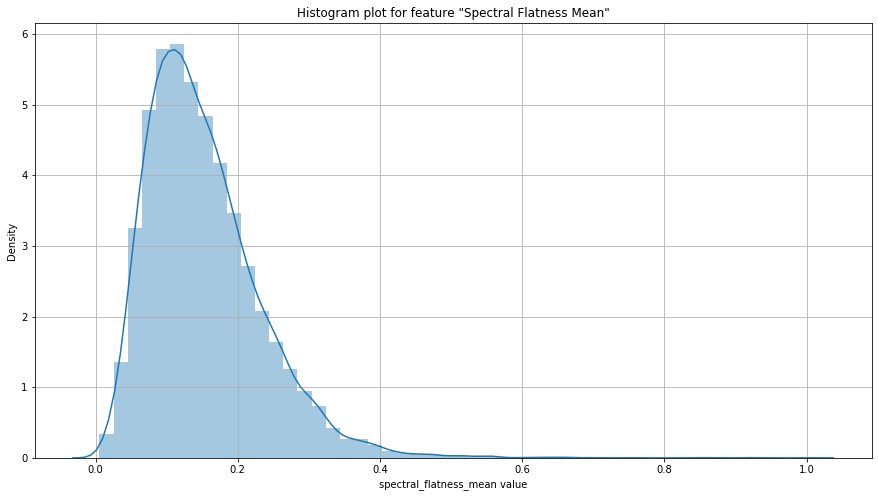

In [36]:
plt.figure(figsize=(15,8))
sns.distplot(genre_data['spectral_flatness_mean'])
plt.grid()
plt.xlabel('spectral_flatness_mean value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Spectral Flatness Mean"')
plt.show()

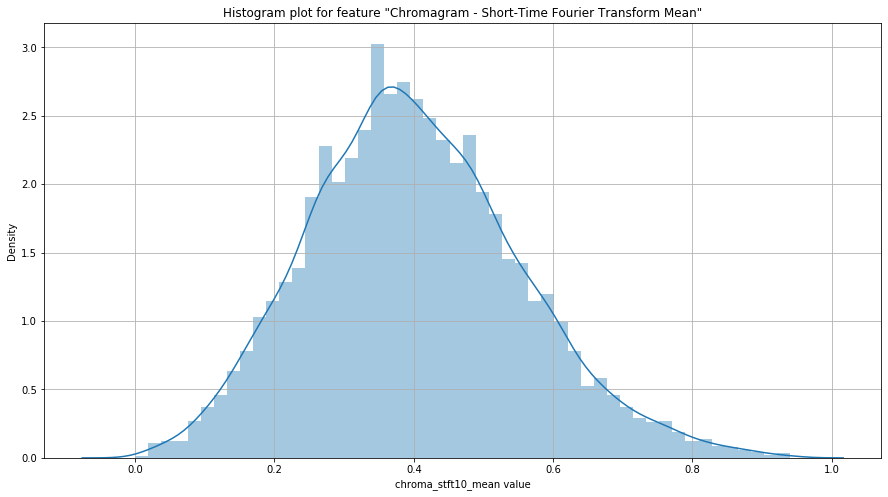

In [37]:
plt.figure(figsize=(15,8))
sns.distplot(genre_data['chroma_stft10_mean'])
plt.grid()
plt.xlabel('chroma_stft10_mean value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Chromagram - Short-Time Fourier Transform Mean"')
plt.show()

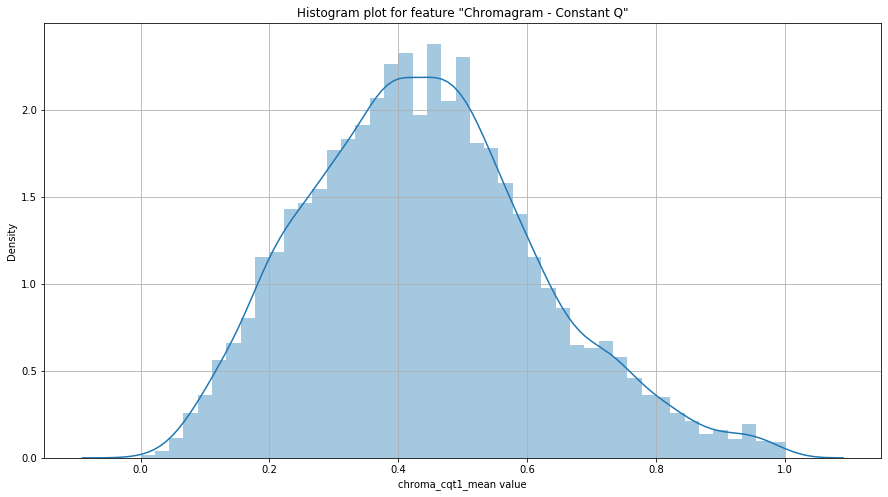

In [38]:
plt.figure(figsize=(15,8))
sns.distplot(genre_data['chroma_cqt1_mean'])
plt.grid()
plt.xlabel('chroma_cqt1_mean value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Chromagram - Constant Q"')
plt.show()

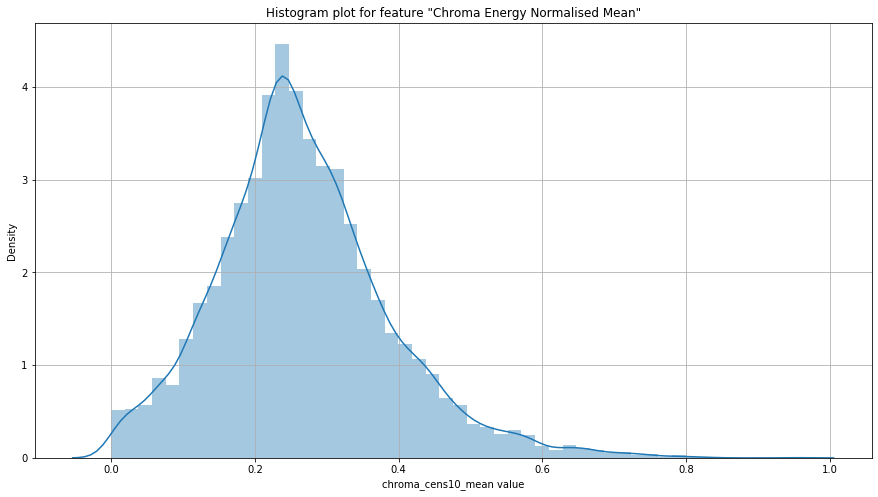

In [39]:
plt.figure(figsize=(15,8))
sns.distplot(genre_data['chroma_cens10_mean'])
plt.grid()
plt.xlabel('chroma_cens10_mean value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Chroma Energy Normalised Mean"')
plt.show()

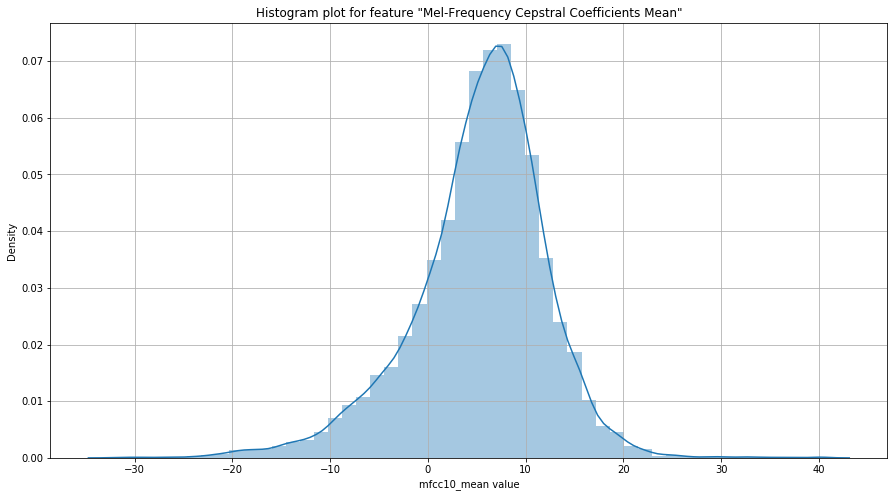

In [40]:
plt.figure(figsize=(15,8))
sns.distplot(genre_data['mfcc10_mean'])
plt.grid()
plt.xlabel('mfcc10_mean value')
plt.ylabel('Density')
plt.title('Histogram plot for feature "Mel-Frequency Cepstral Coefficients Mean"')
plt.show()

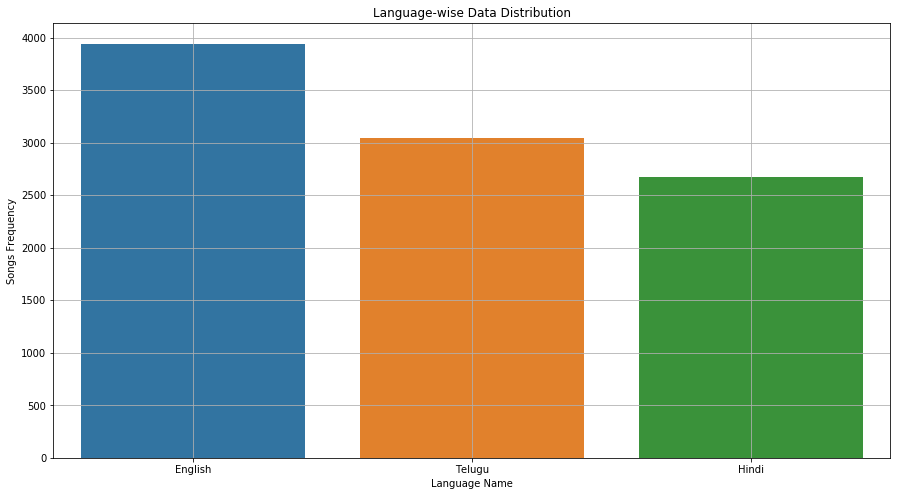

In [41]:
plt.figure(figsize=(15,8))
sns.countplot(genre_data['language'])
plt.grid()
plt.xlabel('Language Name')
plt.ylabel('Songs Frequency')
plt.title('Language-wise Data Distribution')
plt.show()

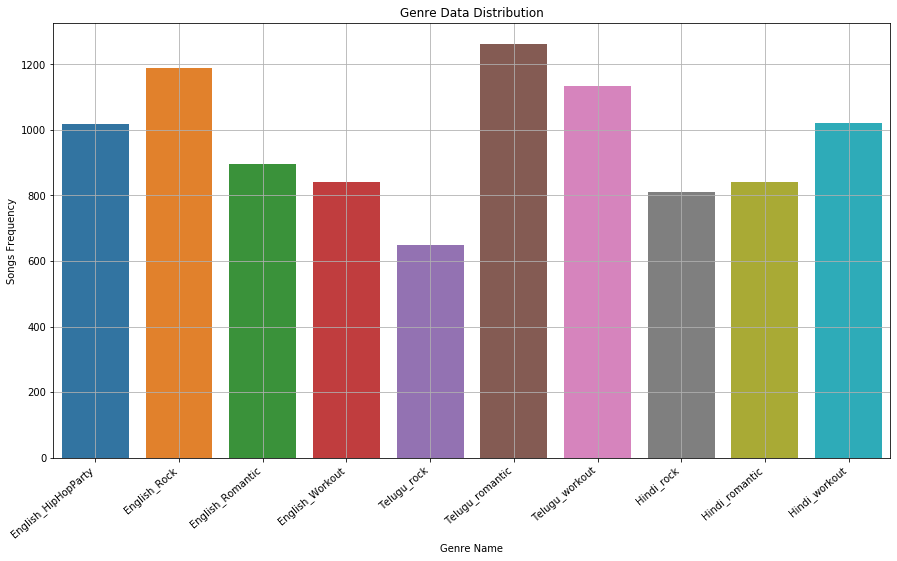

In [44]:
plt.figure(figsize=(15,8))
sns.countplot(genre_data['target'])
plt.grid()
plt.xticks(rotation=40, ha='right')
plt.xlabel('Genre Name')
plt.ylabel('Songs Frequency')
plt.title('Genre Data Distribution')
plt.show()

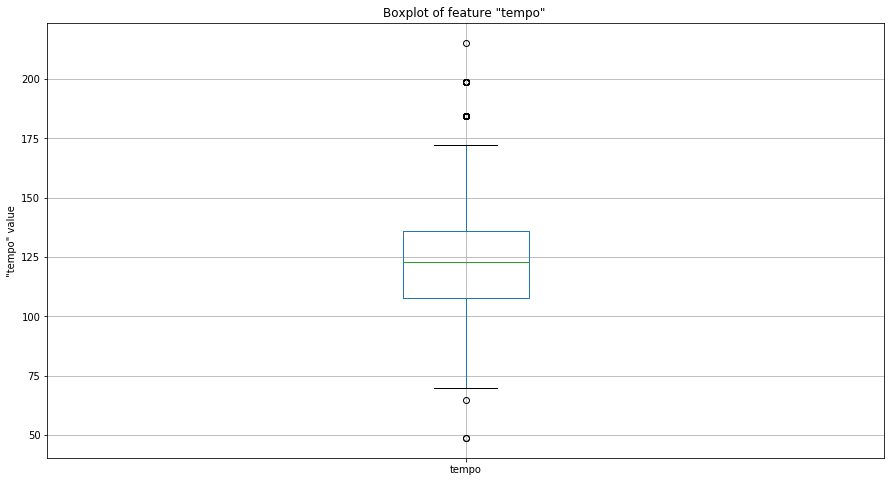

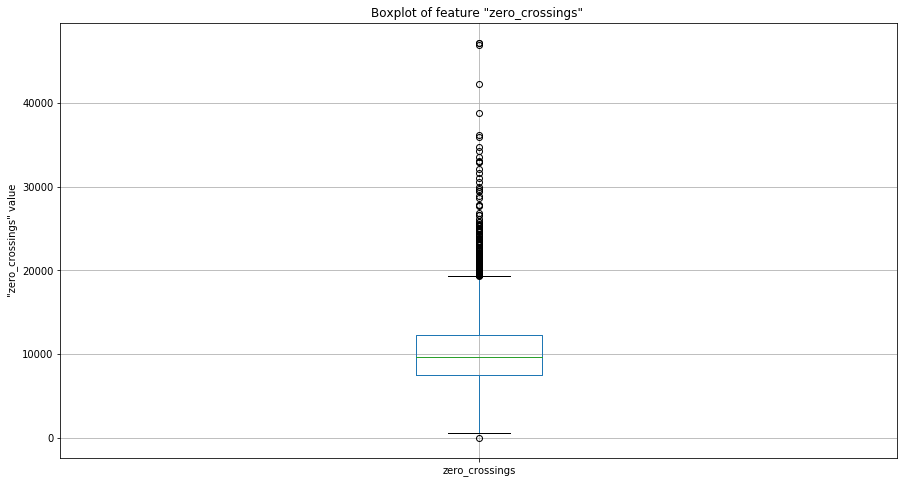

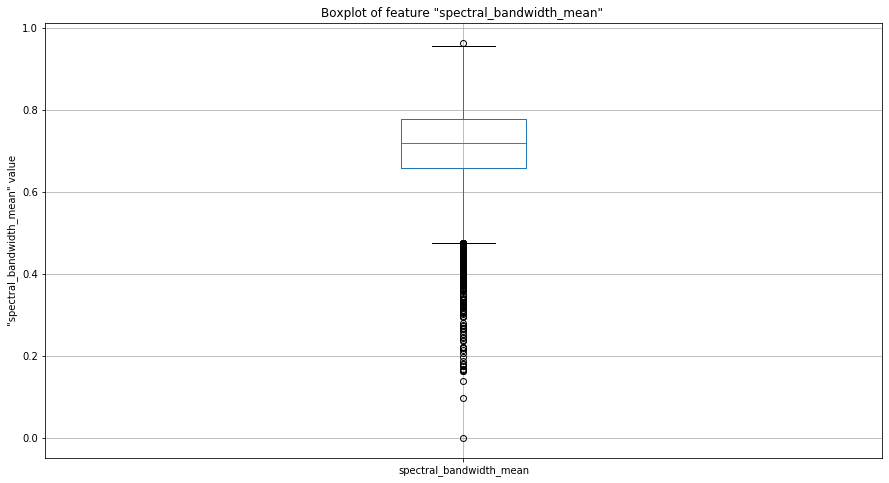

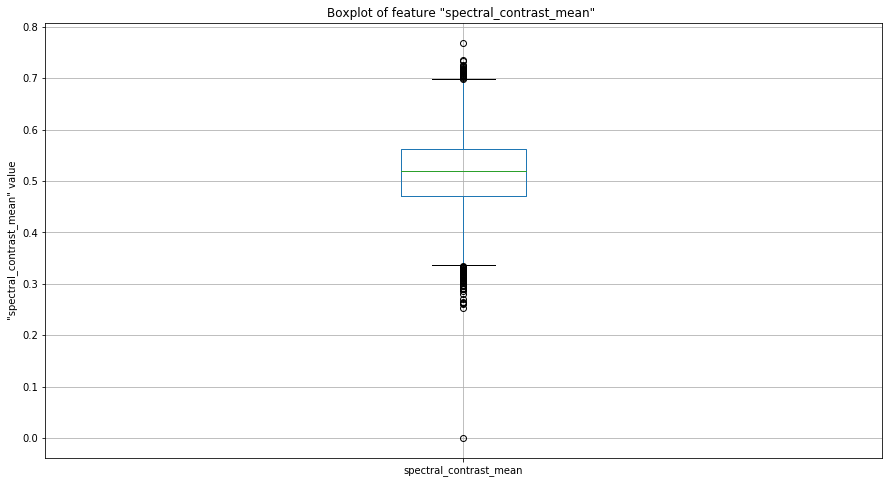

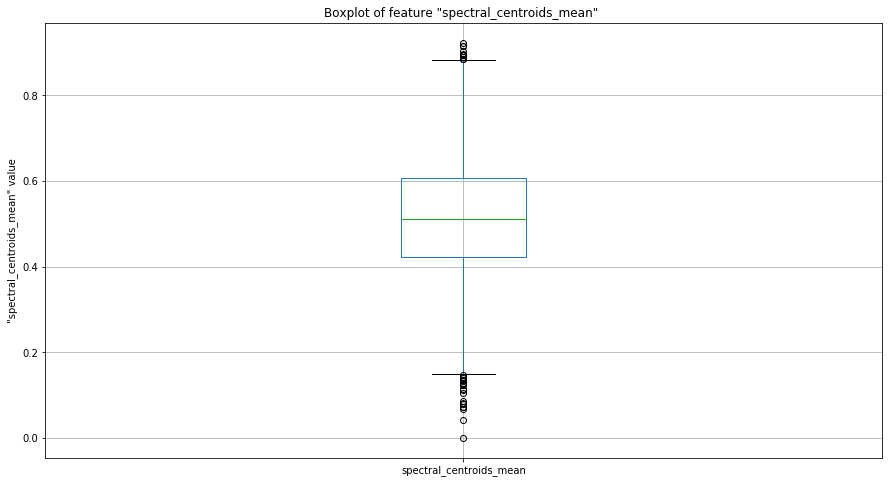

...

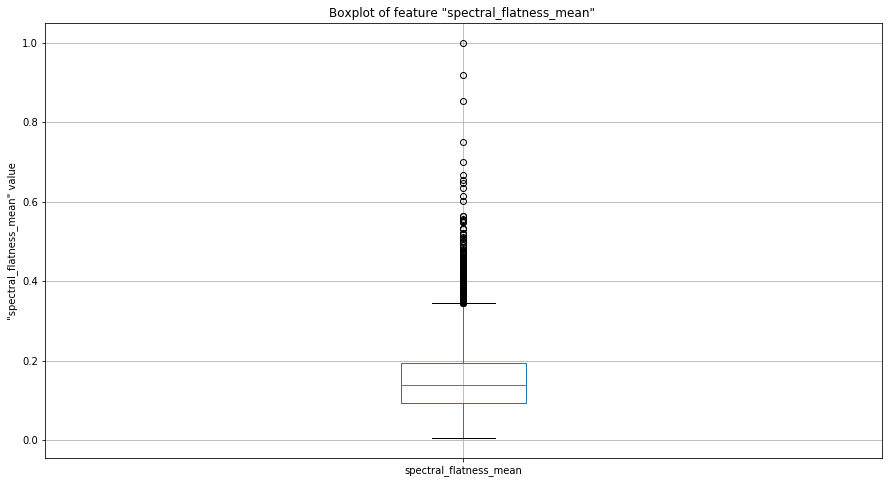

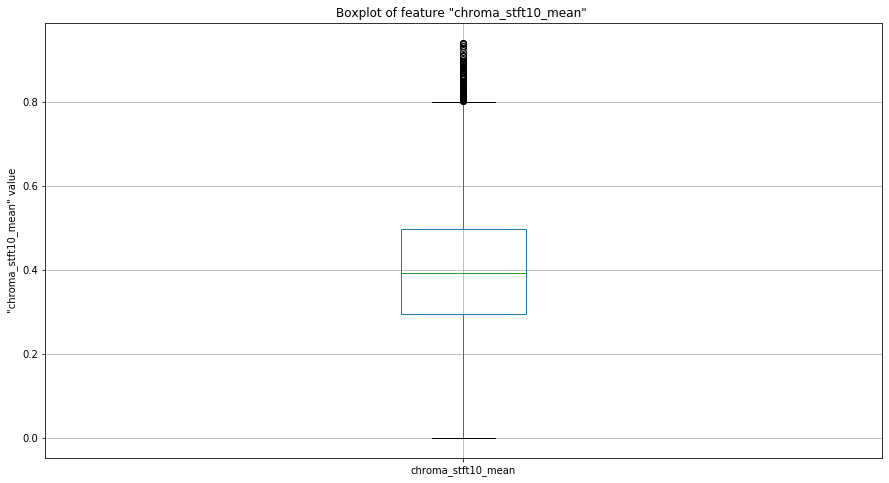

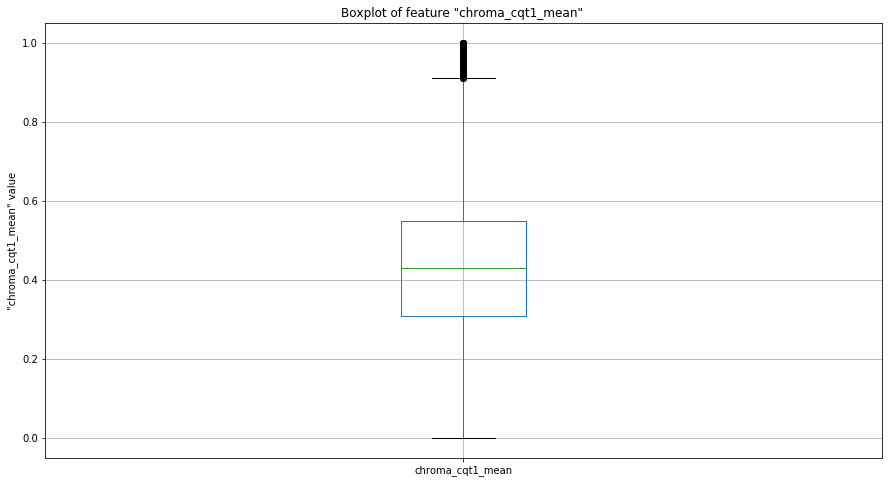

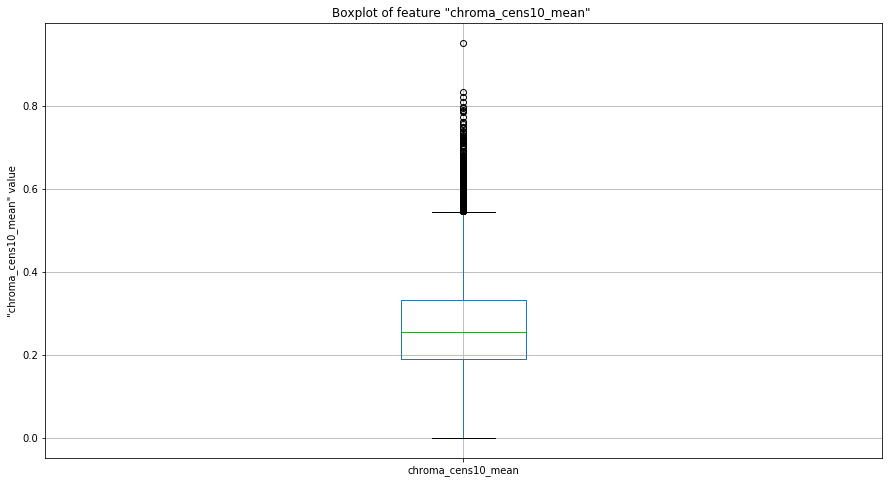

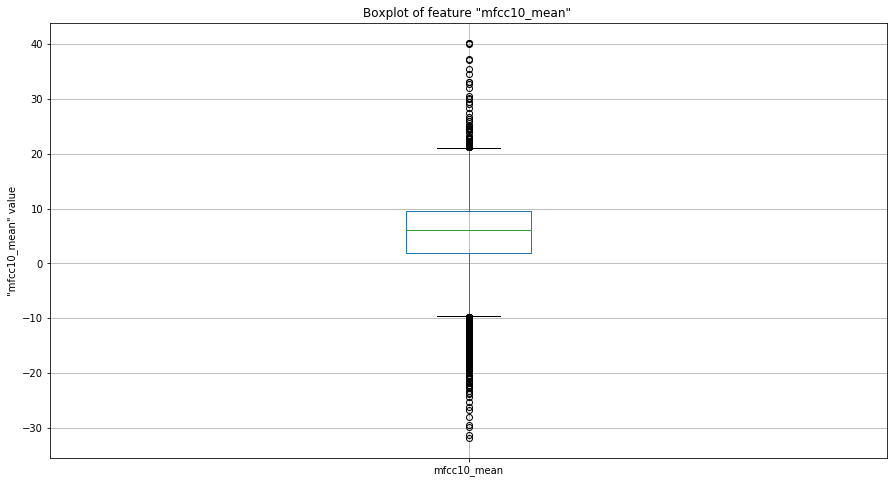

In [45]:
# Visualizing the box plot for the selected features

for i in ['tempo','zero_crossings','spectral_bandwidth_mean','spectral_contrast_mean','spectral_centroids_mean','spectral_rolloff_mean','spectral_flatness_mean','chroma_stft10_mean','chroma_cqt1_mean','chroma_cens10_mean','mfcc10_mean']:
    plt.figure(figsize=(15,8))
    genre_data.boxplot(column=i)
    plt.ylabel('"%s" value' % i)
    plt.title('Boxplot of feature "%s" ' %i)
    plt.show()

In [46]:
# Creating a copy of genres dataframe

df = genre_data.copy()
df.shape

(9659, 127)

In [47]:
# separating target variable from feature variables

df_features = df.drop(['song_id','target','language'], axis=1).copy()
df_target = df['target'].copy()

## Outlier detection

In [48]:
## Outlier detection  using IsolationForest technique

clf=IsolationForest(n_estimators=100, max_samples='auto', contamination=float(.12), \
                        max_features=1.0, bootstrap=False, n_jobs=-1, random_state=42, verbose=0)
clf.fit(df_features)
pred = clf.predict(df_features)
df_features['anomaly'] = pred
outliers=df_features.loc[df_features['anomaly']==-1]
outlier_index=list(outliers.index)

#Find the number of anomalies and normal points here points classified -1 are anomalous

print(df_features['anomaly'].value_counts())

 1    8500
-1    1159
Name: anomaly, dtype: int64


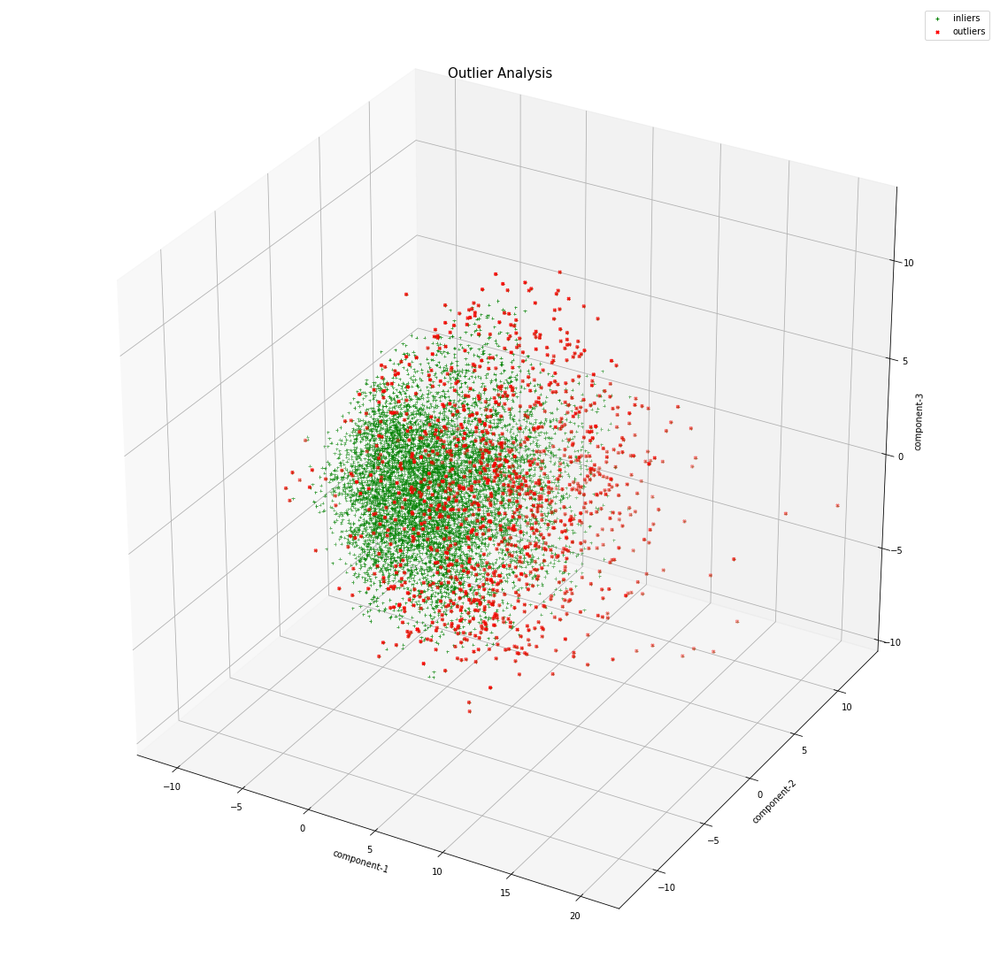

In [49]:
# Principle component analysis - 3D visualization

pca = PCA(n_components=3)  # Reduce to k=3 dimensions
scaler = StandardScaler()

#normalize the metrics

X = scaler.fit_transform(df_features)
X_reduce = pca.fit_transform(X)
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlabel("component-1")
ax.set_ylabel("component-2")
ax.set_zlabel("component-3")

# Plot the compressed data points

ax.scatter(X_reduce[:, 0], X_reduce[:, 1], zs=X_reduce[:, 2], s=10, lw=1, marker="+", label="inliers",c="green")

# Plot x's for the ground truth outliers

ax.scatter(X_reduce[outlier_index,0],X_reduce[outlier_index,1], X_reduce[outlier_index,2],
           lw=2, s=10, marker="x", c="red", label="outliers")
ax.set_title('Outlier Analysis', size=15)
ax.legend()
plt.savefig('genre_data_PCA.jpg')

plt.show()

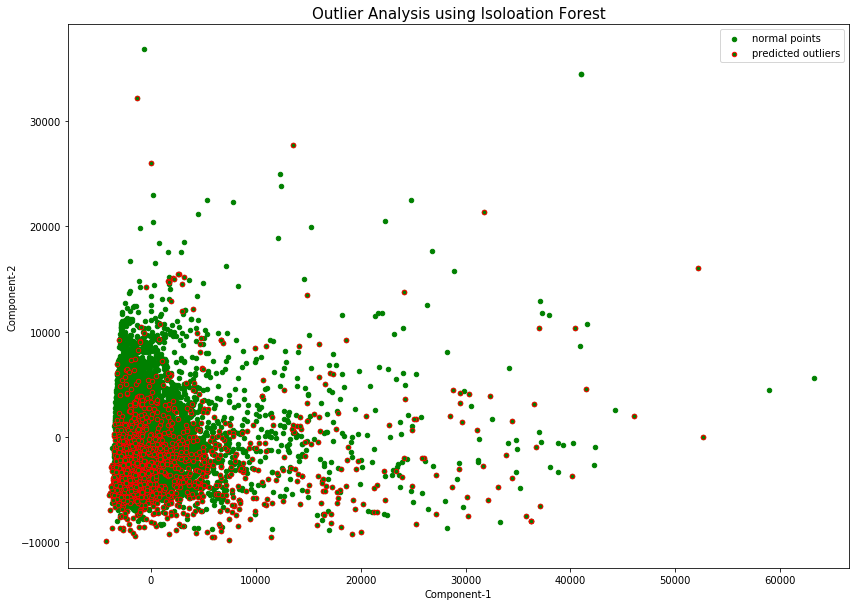

In [50]:
# Principle component analysis - 2D visualization

pca = PCA(2)
pca.fit(df_features)
res=pd.DataFrame(pca.transform(df_features))
Z = np.array(res)
plt.figure(figsize=(14,10))
plt.title("Outlier Analysis using Isoloation Forest", size = 15)
plt.contourf( Z, cmap=plt.cm.Blues_r)
b1 = plt.scatter(res[0], res[1], c='green',
                 s=20,label="normal points")
b1 =plt.scatter(res.iloc[outlier_index,0],res.iloc[outlier_index,1], c='green',s=20,  edgecolor="red",label="predicted outliers")
plt.legend(loc="upper right")
plt.xlabel("Component-1")
plt.ylabel("Component-2")
plt.savefig('sample.jpg')
plt.show()

In [51]:
# Z-score technique to detect outliers present in the data

df_features = df.drop(['song_id','target','language'], axis=1).copy()
df_target = df['target'].copy()

z = np.abs(stats.zscore(df_features))
#print(z)
 
threshold = 5
#print(np.where(z > 5))
 
normal_df = df[(z < 5).all(axis=1)]
print(normal_df.shape)

outlier_df = df[~(z < 5).all(axis=1)]
outlier_df.shape


(8505, 127)


(1154, 127)

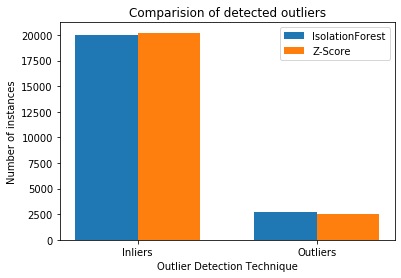

In [52]:
# Plotting and comparing the outliers count obtained by IsolationForest and Z-score techniques.

index = np.arange(2)
bar_width = 0.35

fig, ax = plt.subplots()
summer = ax.bar(index, [20042,2733], bar_width,
                label="IsolationForest")

winter = ax.bar(index+bar_width, [20222,2553],
                 bar_width, label="Z-Score")

ax.set_xlabel('Outlier Detection Technique')
ax.set_ylabel('Number of instances')
ax.set_title('Comparision of detected outliers')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(["Inliers", "Outliers"])
ax.legend()
plt.show()

### Correlation Analysis

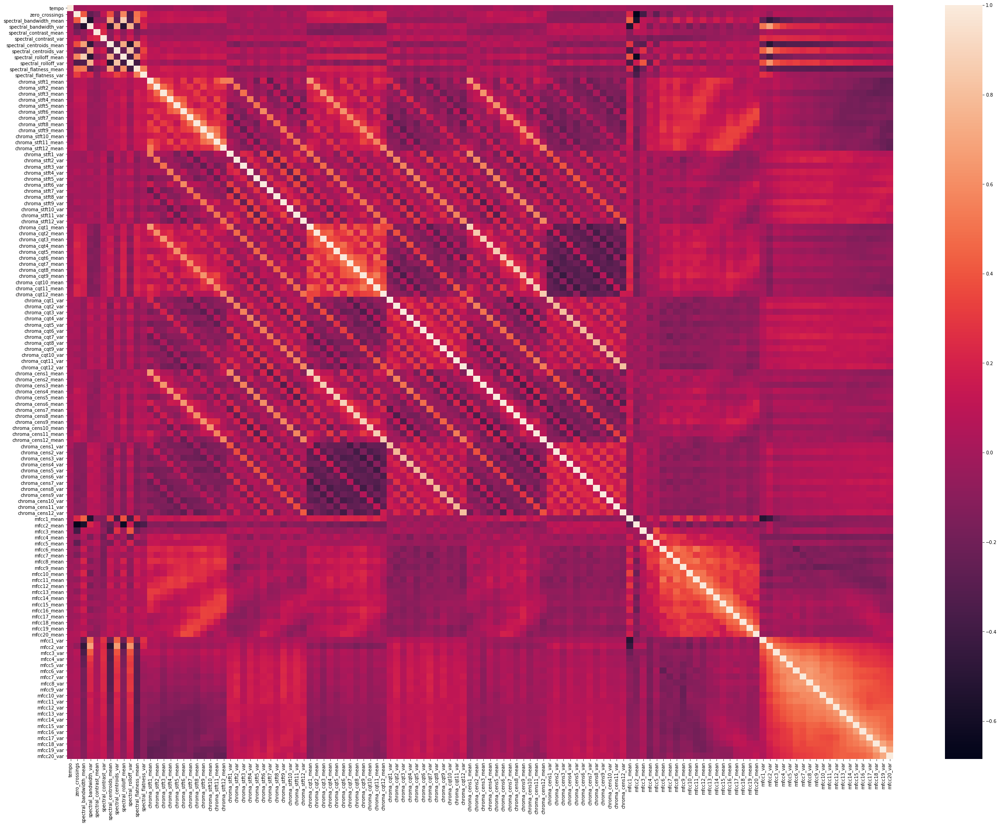

In [53]:
# Building the correlation matrix for all the attributes of the data using seaborn heatmap

corr = df.corr()

# plot the heatmap
plt.figure(figsize=(40,30))
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)
plt.savefig('sample.jpg')
plt.show()

In [54]:
# Generating the Pearson Correlation values against every possible combination of the features

pearsoncorr = df.corr(method='pearson')
corr_df = pearsoncorr.stack().reset_index()
corr_df.columns = ['feature1','feature2','pearson_correlation']
corr_df.head(20)

,feature1,feature2,pearson_correlation
0,tempo,tempo,1.000000
1,tempo,zero_crossings,-0.001328
2,tempo,spectral_bandwidth_mean,0.006218
3,tempo,spectral_bandwidth_var,0.030805
4,tempo,spectral_contrast_mean,0.022322
5,tempo,spectral_contrast_var,0.031562
6,tempo,spectral_centroids_mean,0.019882
7,tempo,spectral_centroids_var,0.027036
8,tempo,spectral_rolloff_mean,0.011457
9,tempo,spectral_rolloff_var,0.022888


In [60]:
# Eliminating all the correlations that were generated using a single variable

corr_df1 = corr_df[corr_df['feature1'] != corr_df['feature2']].copy()
corr_df1.reset_index()

,index,feature1,feature2,pearson_correlation
0,1,tempo,zero_crossings,-0.001328
1,2,tempo,spectral_bandwidth_mean,0.006218
2,3,tempo,spectral_bandwidth_var,0.030805
3,4,tempo,spectral_contrast_mean,0.022322
4,5,tempo,spectral_contrast_var,0.031562
5,6,tempo,spectral_centroids_mean,0.019882
6,7,tempo,spectral_centroids_var,0.027036
7,8,tempo,spectral_rolloff_mean,0.011457
8,9,tempo,spectral_rolloff_var,0.022888
9,10,tempo,spectral_flatness_mean,0.012789


In [61]:
corr_df1.columns

Index(['feature1', 'feature2', 'pearson_correlation'], dtype='object')

In [62]:
corr_df1

,feature1,feature2,pearson_correlation
1,tempo,zero_crossings,-0.001328
2,tempo,spectral_bandwidth_mean,0.006218
3,tempo,spectral_bandwidth_var,0.030805
4,tempo,spectral_contrast_mean,0.022322
5,tempo,spectral_contrast_var,0.031562
6,tempo,spectral_centroids_mean,0.019882
7,tempo,spectral_centroids_var,0.027036
8,tempo,spectral_rolloff_mean,0.011457
9,tempo,spectral_rolloff_var,0.022888
10,tempo,spectral_flatness_mean,0.012789


In [63]:
# Displaying the top 40 instances of the positively correlated variables

corr_df1.sort_values(by=['pearson_correlation'], ascending=False).head(40)

,feature1,feature2,pearson_correlation
7476,chroma_cens1_mean,chroma_cqt1_mean,0.892737
4524,chroma_cqt1_mean,chroma_cens1_mean,0.892737
5149,chroma_cqt6_mean,chroma_cens6_mean,0.890232
8101,chroma_cens6_mean,chroma_cqt6_mean,0.890232
4899,chroma_cqt4_mean,chroma_cens4_mean,0.888413
7851,chroma_cens4_mean,chroma_cqt4_mean,0.888413
5399,chroma_cqt8_mean,chroma_cens8_mean,0.882184
8351,chroma_cens8_mean,chroma_cqt8_mean,0.882184
5524,chroma_cqt9_mean,chroma_cens9_mean,0.881901
8476,chroma_cens9_mean,chroma_cqt9_mean,0.881901


In [64]:
# Displaying the top 20 instances of the negatively correlated variables

corr_df1.sort_values(by=['pearson_correlation'], ascending=True).head(20)

,feature1,feature2,pearson_correlation
10541,mfcc2_mean,zero_crossings,-0.684239
209,zero_crossings,mfcc2_mean,-0.684239
1077,spectral_rolloff_mean,mfcc2_mean,-0.620354
10548,mfcc2_mean,spectral_rolloff_mean,-0.620354
10542,mfcc2_mean,spectral_bandwidth_mean,-0.561352
333,spectral_bandwidth_mean,mfcc2_mean,-0.561352
374,spectral_bandwidth_var,spectral_bandwidth_mean,-0.533464
251,spectral_bandwidth_mean,spectral_bandwidth_var,-0.533464
456,spectral_bandwidth_var,mfcc1_mean,-0.528901
10419,mfcc1_mean,spectral_bandwidth_var,-0.528901


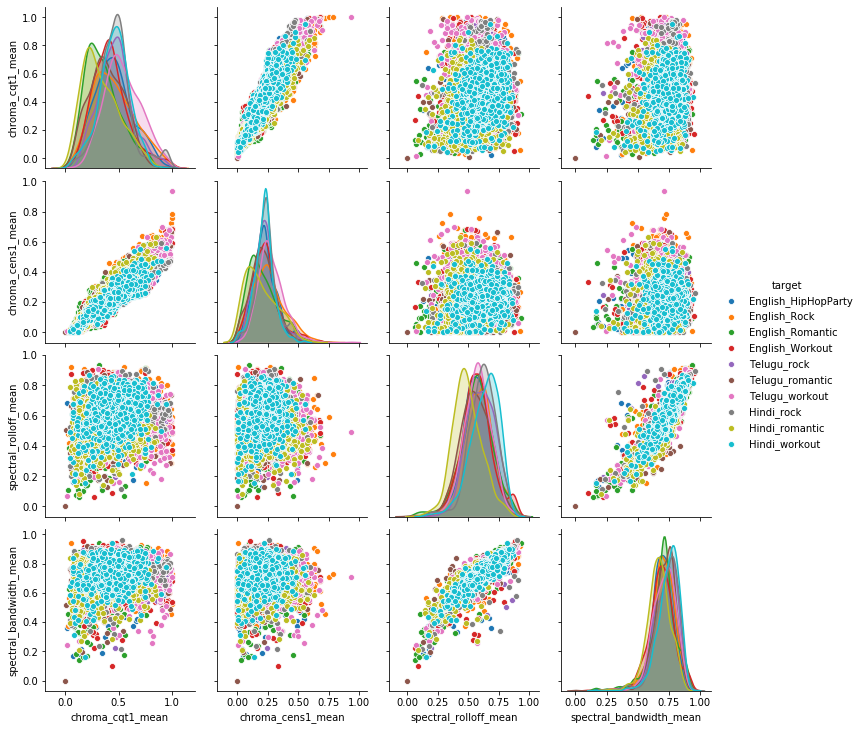

In [65]:
# Pairwise plotting to visualize the correlation amongst the top positively correlated variables

sns.pairplot(df[['chroma_cqt1_mean', 'chroma_cens1_mean', 'spectral_rolloff_mean', 'spectral_bandwidth_mean', 'target']], hue='target')
plt.show()

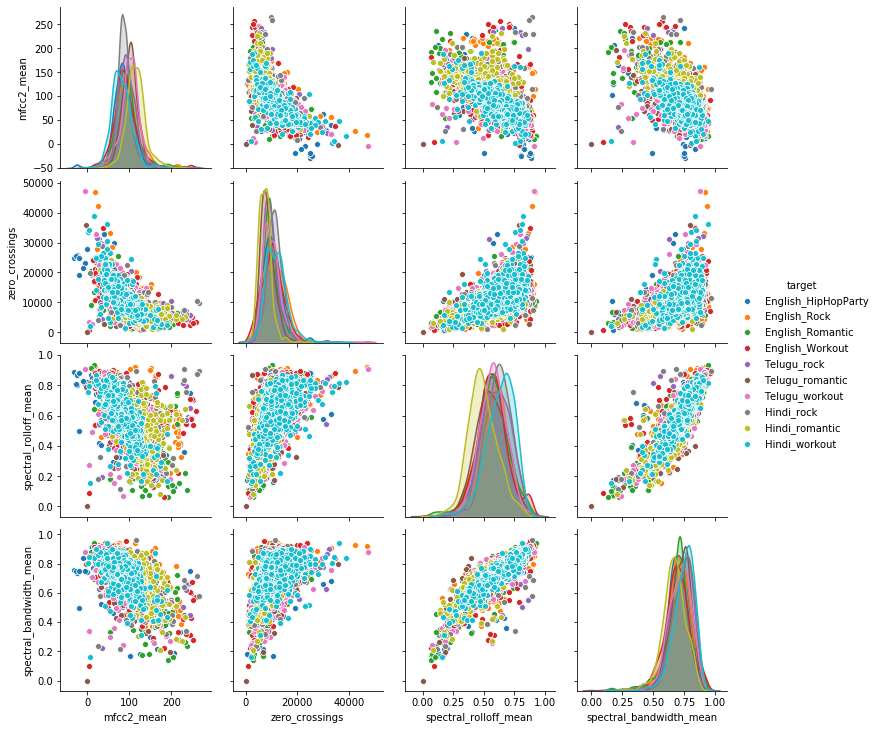

In [66]:
# Pairwise plotting to visualize the correlation amongst the top negatively correlated variables

sns.pairplot(df[['mfcc2_mean', 'zero_crossings', 'spectral_rolloff_mean', 'spectral_bandwidth_mean', 'target']], hue='target')
plt.show()

## PCA:

In [2]:
# separating target variable from feature variables

df_features = df.drop(['song_id','target','language'], axis=1).copy()
df_target = df['target'].copy()

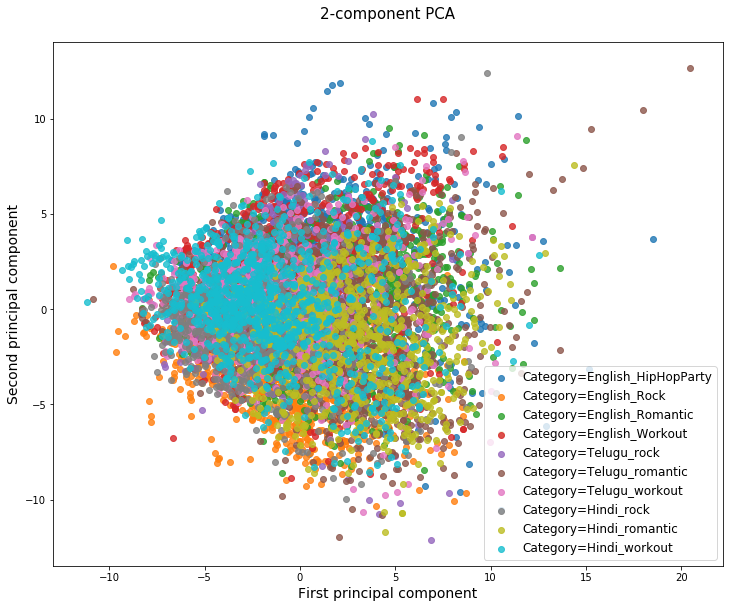

In [68]:
# pipelining and transforming the feature data to reduce the dimentionality

pca_pipeline = make_pipeline(StandardScaler(), PCA(n_components=2))
pca_transformed = pca_pipeline.fit_transform(df_features)

# visualize the features variable data using PCA(n_component = 2) using quality variable to label the data.

target = list(df_target.unique())
#marker = ['o','+','<','^','*']
plt.figure(figsize = (12,12))
for i in range(len(target)):  
    plt.scatter(pca_transformed[df.target==target[i], 0], pca_transformed[df.target==target[i], 1], 
                #marker = marker[i], 
                alpha=.8, label = 'Category=%s'%target[i])

plt.gca().set_aspect("equal")
plt.xlabel("First principal component", fontsize = 14)
plt.ylabel("Second principal component", fontsize = 14)
plt.legend(loc='best', fontsize = 12)
plt.title('2-component PCA\n', fontsize = 15)
plt.show()

<Figure size 432x288 with 0 Axes>

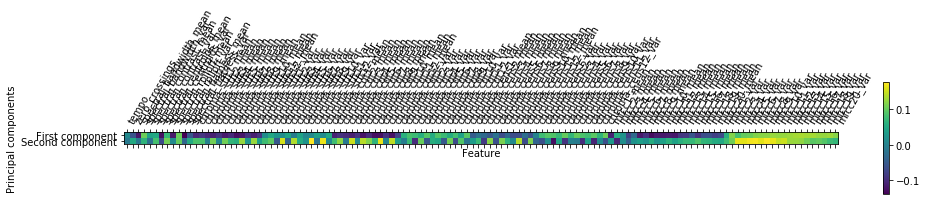

In [69]:
# Visualising data variance of all the feature attributes with respect to 1st and 2nd principal components 

components = pca_pipeline.named_steps['pca'].components_
plt.figure()
plt.matshow(components, cmap='viridis')
plt.yticks([0, 1], ["First component", "Second component"])
plt.colorbar()
plt.xticks(range(len(df_features.columns)),
           df_features.columns, rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components")
plt.show()

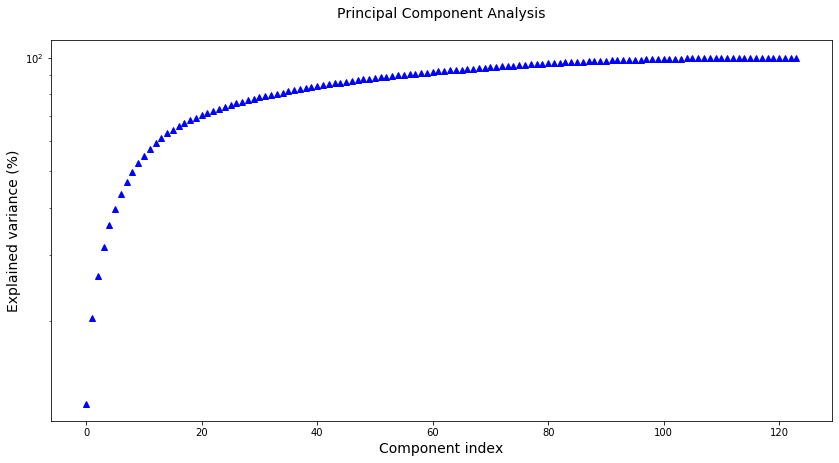

In [70]:
# Explained variance for the n components

pca_scaled = make_pipeline(StandardScaler(), PCA())
pca_scaled.fit(df_features)
pca = pca_scaled.named_steps['pca']
plt.figure(figsize=(14,7))
plt.semilogy(np.cumsum(pca.explained_variance_ratio_*100), 'b^')
plt.xlabel("Component index", fontsize = 14)
plt.ylabel("Explained variance (%)", fontsize = 14)
plt.title("Principal Component Analysis\n", fontsize= 14)
plt.show()

In [71]:
# pipelining and transforming the feature data to reduce the dimentionality

pca_pipeline = make_pipeline(StandardScaler(), PCA(n_components=90))
pca_transformed = pca_pipeline.fit_transform(df_features)

In [72]:
# Building the dataframe on 80 components obtained from PCA

pca_df = pd.DataFrame(data = pca_transformed)
finalDf = pd.concat([pca_df, df_target], axis = 1)
finalDf.shape

(9659, 91)

In [73]:
# Displaying first five instances of the data

finalDf.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,target
0,5.981779,0.877041,6.125297,2.589149,5.042832,5.892499,-3.552737,2.189388,-4.451867,2.051966,4.437682,2.189826,-2.681054,-0.402227,2.664527,-0.621467,2.953204,-0.461453,0.912728,0.916120,-0.371795,0.625208,1.308536,1.649032,-0.873719,-0.962544,-1.005788,0.459617,-0.801598,0.279207,-0.125324,0.834859,0.739678,-0.662928,1.313446,0.417908,1.307776,0.370330,0.926662,-0.499939,0.312308,0.119373,0.095392,0.347665,0.127528,0.367019,0.358644,-0.170421,-0.570881,-0.858923,0.926433,0.298391,-0.328794,0.008703,0.982791,-1.059929,-0.983797,0.897560,-0.327502,-0.776739,-0.272832,0.010430,2.618668,-1.173666,-0.285949,0.605272,-1.421193,-0.805397,0.675662,0.258292,-0.762185,-0.363009,-1.702431,2.396432,-0.113933,-2.194243,-0.388175,0.158564,-0.718627,-1.810782,0.938631,-1.991105,-0.163185,-0.597464,0.855040,-1.024524,0.942214,1.060616,-0.032104,0.724293,English_HipHopParty
1,6.127472,1.245377,5.972584,3.089422,4.220182,5.213958,-2.468576,1.874529,-3.975218,2.315908,2.772489,1.122020,-2.801573,-0.113374,0.566886,-0.785436,1.059342,-0.555681,0.594108,0.685192,-0.044138,0.154793,-0.121284,1.730377,-0.599541,-0.669030,-0.858138,0.936445,-0.060034,0.888919,-0.712851,-0.107046,0.880973,-0.689784,1.402925,0.069001,-0.226919,0.594483,1.383321,-0.014693,0.624642,-0.833998,-1.269126,0.028537,0.309656,0.219919,0.301578,-0.358596,-1.593684,-0.985804,0.743099,0.111460,-0.463497,-0.022347,0.916132,-1.372980,-1.207992,0.563019,-0.390151,-0.286887,-0.036444,-0.205997,2.034672,-0.880578,-0.505669,0.618769,-1.166444,-0.429830,0.598737,0.188563,0.066296,-0.233746,-1.440430,1.240268,-0.329611,-1.394670,0.055112,0.998193,-0.264737,-0.993005,0.765397,-1.089023,-0.084590,0.171982,0.272143,-0.699377,0.565562,0.552680,-0.348714,0.472749,English_HipHopParty
2,5.172627,1.414000,6.536934,2.903600,1.707707,3.514837,-1.150563,1.694019,-2.869184,1.096035,3.251946,1.738479,-2.093875,0.387404,1.218509,1.191249,-0.018246,-1.044161,0.101668,0.747194,-0.301342,-0.200456,0.110013,1.419270,-0.123579,-0.610151,-0.833653,1.006389,-0.090421,1.052810,-0.719724,-0.422109,0.743655,-1.366236,0.963483,-1.634424,-0.127481,1.369588,1.055604,-0.118455,0.214891,-1.597865,-1.161430,-1.195220,0.458830,-0.090871,0.500895,0.147289,-1.573650,-0.987402,1.273948,0.055298,-0.645876,0.219430,0.851060,-1.333913,-1.347584,1.172440,-0.810497,0.241810,0.471161,1.086662,1.199985,-1.554027,-0.594659,-0.287733,-0.489491,0.026544,0.135791,0.118264,-0.271963,-0.025898,-0.945633,1.118620,-0.896936,-1.208090,-0.389794,1.289612,0.287004,-0.608727,0.345738,-0.486530,0.065778,-0.222759,0.704102,-0.610948,-0.135729,0.352471,0.129980,0.180301,English_HipHopParty
3,3.827175,4.207265,3.274808,2.983916,1.573987,3.390337,0.786223,1.544706,-3.372448,1.352712,3.600989,0.024149,-1.610266,-0.677143,-0.195190,0.734844,-0.203587,-1.510190,0.193669,0.970411,0.568455,0.198803,1.481638,1.009789,0.028381,-0.778557,-0.805786,0.865871,-0.072963,0.895964,-1.003437,0.087715,-0.194084,-0.444924,1.506011,-1.218423,-0.408274,0.213663,0.984593,-0.141584,0.263135,-0.648670,-0.719349,-0.853563,-0.329721,0.182596,0.747369,-0.499922,-0.647868,-0.185951,0.526227,-0.211140,-0.181885,-0.009851,-0.180101,-1.135838,0.125601,0.578277,0.318230,0.115206,0.292483,2.309638,0.940072,-0.959241,-1.154538,0.400914,0.008067,-0.237497,0.825201,0.802841,-0.517592,-0.239484,-0.501954,0.434316,-0.640520,-0.296018,-0.037507,1.010813,-0.145492,-0.412904,0.902490,-0.235073,-0.076526,-0.033885,0.947445,-0.453015,-0.469292,0.358284,0.387077,-0.261196,English_HipHopParty
4,-1.856591,3.859385,1.894855,1.670821,4.706613,3.945676,0.072540,1.970401,-3.121050,1.876198,2.427332,1.294499,-1.590088,-2.064204,0.812195,1.023021,0.259864,-1.460308,0.175637,0.967412,0.642294,0.698397,0.784402,-0.768394,0.791208,0